
# Augmentacja obrazów – praktyka

Ten notatnik pokazuje **krok po kroku** jak wykonać augmentacje obrazów:
- transformacje geometryczne (rotacja, skalowanie, translacja, ścinanie, odbicia, perspektywa),
- transformacje „fotograficzne” (jasność, nasycenie, kontrast, ziarno/szum),
- oraz **kompozycje** tych operacji.

> **Cel dydaktyczny:** zrozumieć, że transformacje geometryczne można zapisać macierzowo jako przekształcenia afiniczne (2×3) lub homografie (3×3), a kolejność mnożenia macierzy ma znaczenie.


##  Instalacje i importy - biblioteki python niezbędne do wykonania ćwiczenia

1.   opencv
2.   scipy




In [1]:

!pip -q install opencv-python-headless scipy

import os, math, glob, random
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab import files

In [2]:
OUT_DIR = "/content/augmented"
os.makedirs(OUT_DIR, exist_ok=True)

def imshow(img, title=None, size=6):
    plt.figure(figsize=(size, size))
    if img.ndim == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    if title: plt.title(title)
    plt.axis('off')
    plt.show()

def save_rgb(img, name):
    path = os.path.join(OUT_DIR, name)
    if img.ndim == 3:
        cv2.imwrite(path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    else:
        cv2.imwrite(path, img)
    return path



## 1. Wgraj obraz

Uruchom komórkę poniżej i wybierz plik `.jpg` / `.png`.  
Jeśli obraz już jest w katalogu głównym Colaba, możesz pominąć `files.upload()` i po prostu ustawić `filename`.


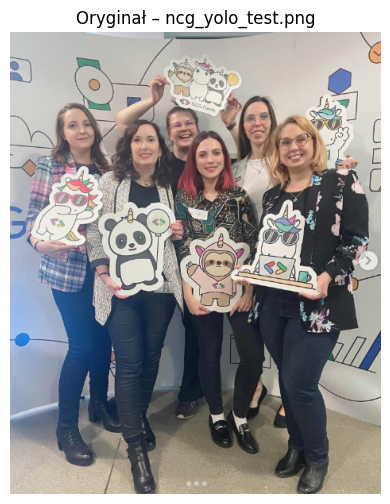

Wymiary: (582, 467, 3)


In [3]:

# a) Wgrywanie interaktywne
# uploaded = files.upload()   # odkomentuj jeśli chcesz wgrywać z dysku
# filename = list(uploaded.keys())[0]

# b) Lub użyj nazwy pliku, który już jest w środowisku:
filename = "ncg_yolo_test.png"  # <-- zmień w razie potrzeby

# Wczytanie obrazu jako RGB
img_bgr = cv2.imread(filename, cv2.IMREAD_COLOR)
assert img_bgr is not None, f"Nie mogę wczytać pliku: {filename}"
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

imshow(img, f"Oryginał – {filename}")
H, W = img.shape[:2]
print("Wymiary:", img.shape)


### Przycięcie obrazu do proporcji kwadratu

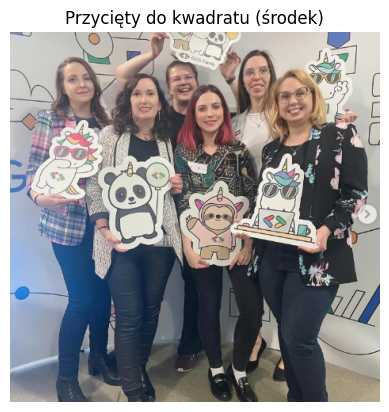

Zapisano: /content/augmented/img_wsei_crop_square.jpg


In [4]:

def crop_center_square(image):
    """
    Przycina obraz centralnie do kwadratu (bez zmiany skali).
    Wybiera krótszy bok i wycina środek.
    """
    h, w = image.shape[:2]
    min_side = min(h, w)
    # współrzędne środka
    start_x = w//2 - min_side//2
    start_y = h//2 - min_side//2
    cropped = image[start_y:start_y+min_side, start_x:start_x+min_side]
    return cropped

# 🔹 użycie:
square_crop = crop_center_square(img)
plt.imshow(square_crop)
plt.axis("off")
plt.title("Przycięty do kwadratu (środek)")
plt.show()

# 🔹 zapis:
cv2.imwrite("/content/augmented/img_wsei_crop_square.jpg", cv2.cvtColor(square_crop, cv2.COLOR_RGB2BGR))
print("Zapisano: /content/augmented/img_wsei_crop_square.jpg")


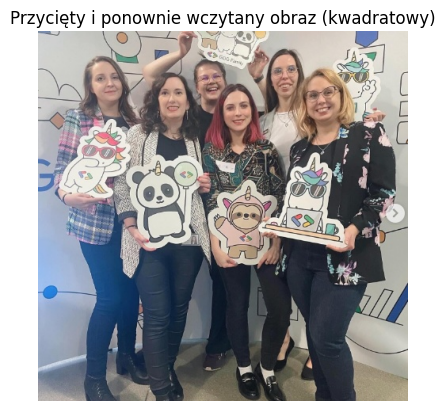

In [5]:
filename = '/content/augmented/img_wsei_crop_square.jpg'  # pełna ścieżka
img_bgr = cv2.imread(filename, cv2.IMREAD_COLOR)

if img_bgr is None:
    raise FileNotFoundError(f" Nie znaleziono pliku: {filename}")

img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis("off")
plt.title("Przycięty i ponownie wczytany obraz (kwadratowy)")
plt.show()


## 2. Teoria – przekształcenia jako macierze

Współrzędne jednorodne punktu obrazu zapisujemy jako wektor $\mathbf{x}=[x\;y\;1]^T$.  
Transformację opisuje macierz $H\in\mathbb{R}^{3\times3}$: $\mathbf{x}' \sim H\mathbf{x}$.

**Przykładowe macierze:**
- Rotacja $R(\theta)$:  
$$\begin{bmatrix}\cos\theta & -\sin\theta & 0\\ \sin\theta & \cos\theta & 0\\ 0&0&1\end{bmatrix}$$
- Skalowanie $S(s_x,s_y)$:  
$$\begin{bmatrix}s_x & 0 & 0\\ 0 & s_y & 0\\ 0&0&1\end{bmatrix}$$
- Translacja $T(t_x,t_y)$:  
$$\begin{bmatrix}1 & 0 & t_x\\ 0 & 1 & t_y\\ 0&0&1\end{bmatrix}$$
- Ścinanie $Sh(k_x,k_y)$:  
$$\begin{bmatrix}1 & k_x & 0\\ k_y & 1 & 0\\ 0&0&1\end{bmatrix}$$

> **Kompozycja** przekształceń to mnożenie macierzy (kolejność ma znaczenie – ogólnie $AB\neq BA$).


## 3. Rotacja – 3 warianty

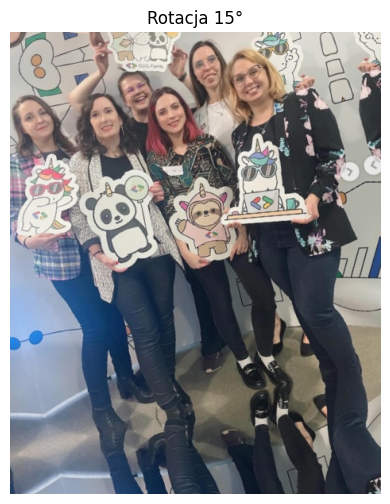

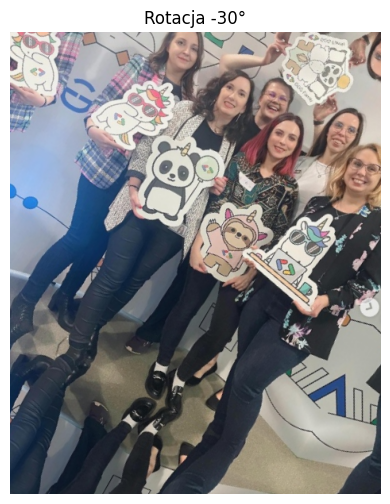

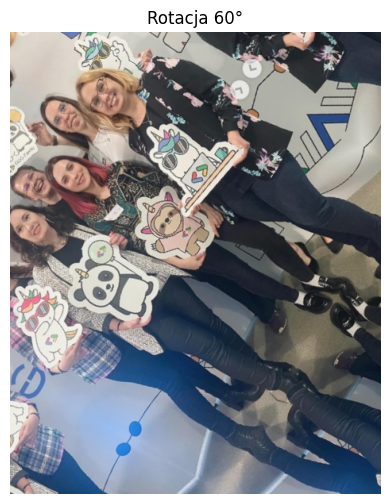

In [6]:

center = (W/2, H/2)
angles = [15, -30, 60]

for a in angles:
    M = cv2.getRotationMatrix2D(center, a, 1.0)
    rot = cv2.warpAffine(img, M, (W, H), borderMode=cv2.BORDER_REFLECT101)
    save_rgb(rot, f"rot_{a}.jpg")
    imshow(rot, f"Rotacja {a}°")


## 4. Skalowanie – 3 warianty

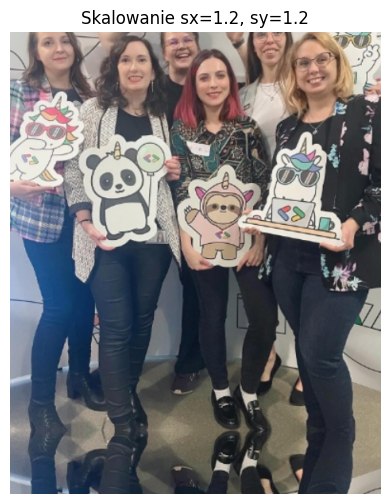

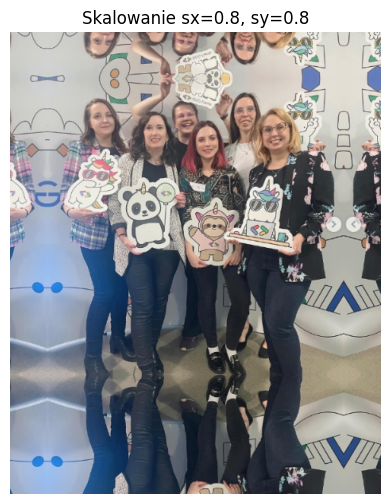

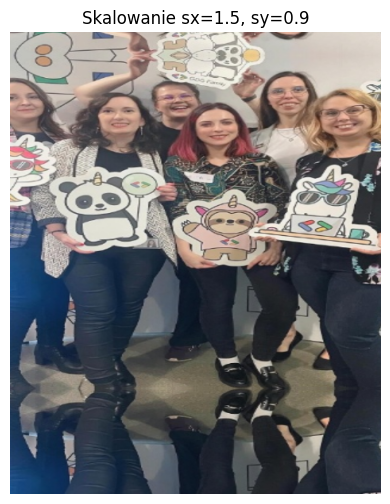

In [7]:

scales = [(1.2, 1.2), (0.8, 0.8), (1.5, 0.9)]
for sx, sy in scales:
    M = np.float32([[sx, 0, (1-sx)*center[0]],
                    [0, sy, (1-sy)*center[1]]])
    out = cv2.warpAffine(img, M, (W, H), borderMode=cv2.BORDER_REFLECT101)
    save_rgb(out, f"scale_{sx:.2f}_{sy:.2f}.jpg")
    imshow(out, f"Skalowanie sx={sx}, sy={sy}")


## 5. Translacja – 3 warianty

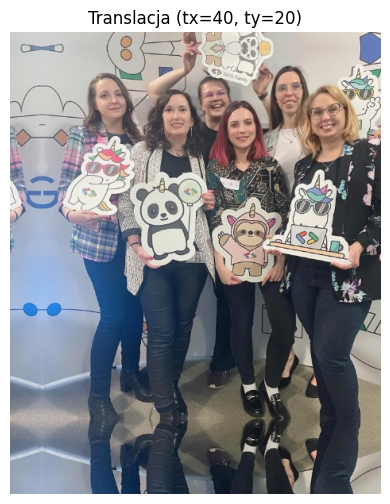

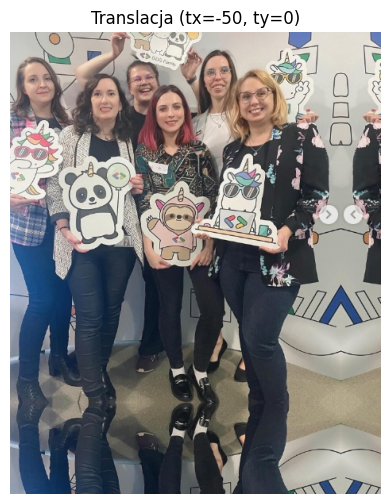

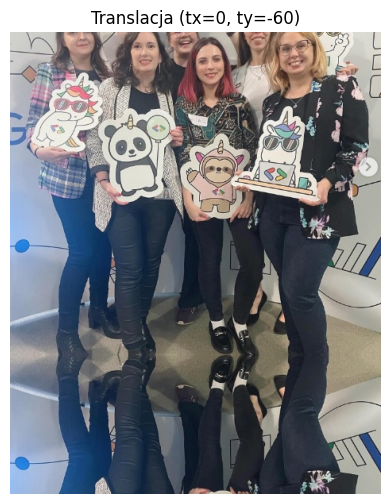

In [8]:

shifts = [(40, 20), (-50, 0), (0, -60)]
for tx, ty in shifts:
    M = np.float32([[1,0,tx],[0,1,ty]])
    out = cv2.warpAffine(img, M, (W, H), borderMode=cv2.BORDER_REFLECT101)
    save_rgb(out, f"shift_{tx}_{ty}.jpg")
    imshow(out, f"Translacja (tx={tx}, ty={ty})")


## 6. Ścinanie (shear) – 3 warianty

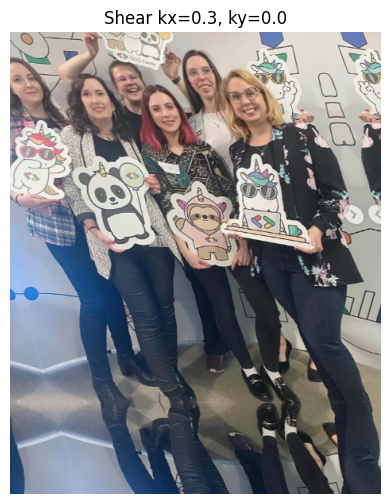

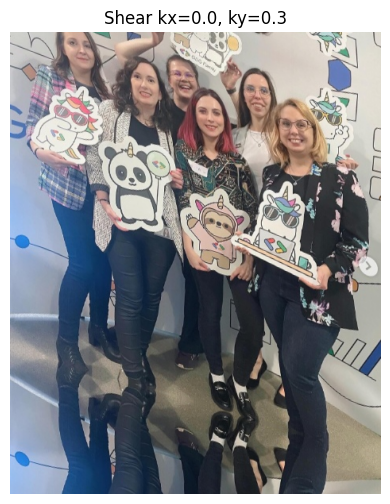

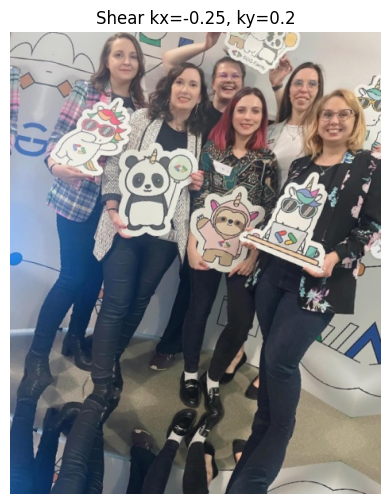

In [9]:

shears = [(0.3, 0.0), (0.0, 0.3), (-0.25, 0.2)]
for kx, ky in shears:
    M = np.float32([[1, kx, -kx*center[1]],
                    [ky, 1, -ky*center[0]]])
    out = cv2.warpAffine(img, M, (W, H), borderMode=cv2.BORDER_REFLECT101)
    save_rgb(out, f"shear_{kx}_{ky}.jpg")
    imshow(out, f"Shear kx={kx}, ky={ky}")


## 7. Odbicia (flipy) – 3 warianty

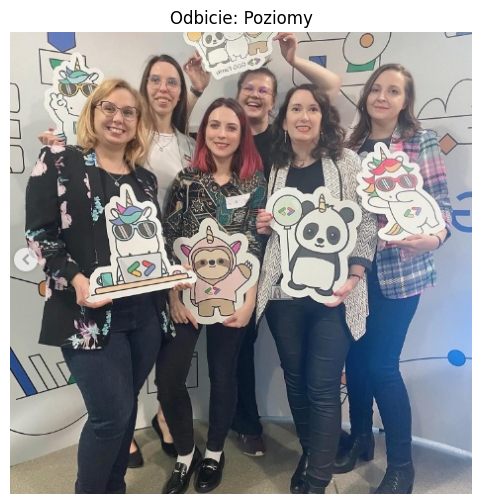

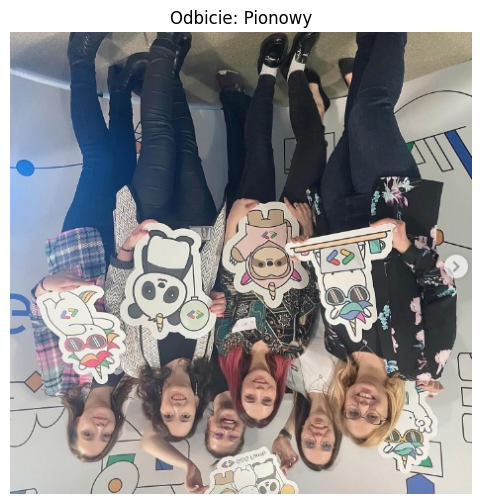

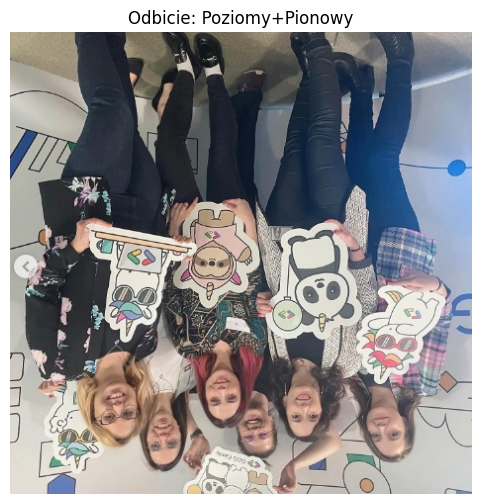

In [10]:

flips = [1, 0, -1]   # 1: poziomy, 0: pionowy, -1: oba
names = {1:"Poziomy", 0:"Pionowy", -1:"Poziomy+Pionowy"}
for code in flips:
    out = cv2.flip(img, code)
    save_rgb(out, f"flip_{code}.jpg")
    imshow(out, f"Odbicie: {names[code]}")


## 8. Perspektywa (homografia) – 3 warianty

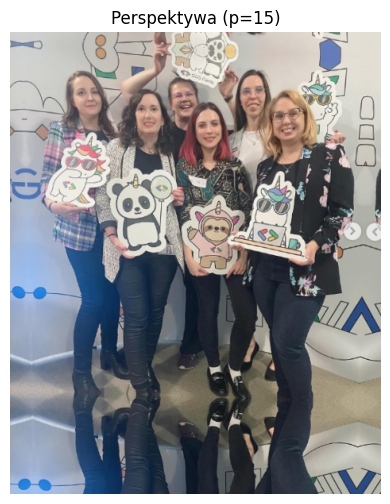

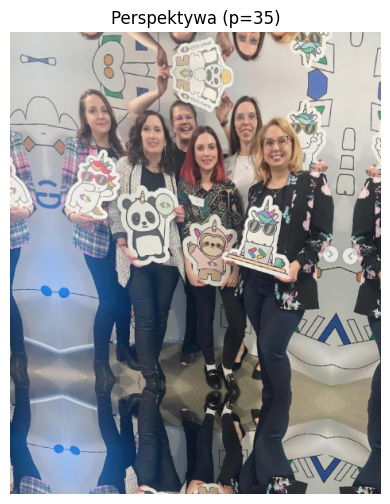

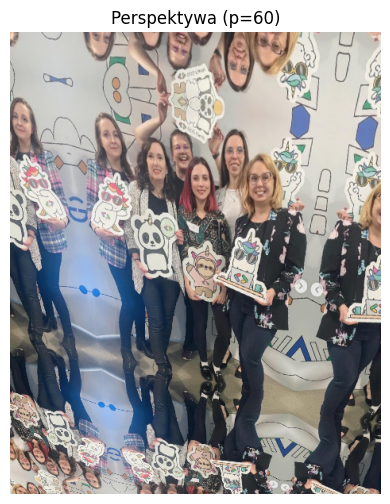

In [11]:

def quad(W, H, p):
    return np.float32([[0+p, 0+p],
                       [W-1-p, 0+2*p],
                       [W-1-2*p, H-1-p],
                       [0+2*p, H-1-2*p]])

src = np.float32([[0,0],[W-1,0],[W-1,H-1],[0,H-1]])
powers = [15, 35, 60]
for p in powers:
    dst = quad(W, H, p)
    Hm = cv2.getPerspectiveTransform(src, dst)
    out = cv2.warpPerspective(img, Hm, (W, H), borderMode=cv2.BORDER_REFLECT101)
    save_rgb(out, f"persp_{p}.jpg")
    imshow(out, f"Perspektywa (p={p})")


## 9. Kolor: jasność, nasycenie, kontrast, ziarno – 3 warianty

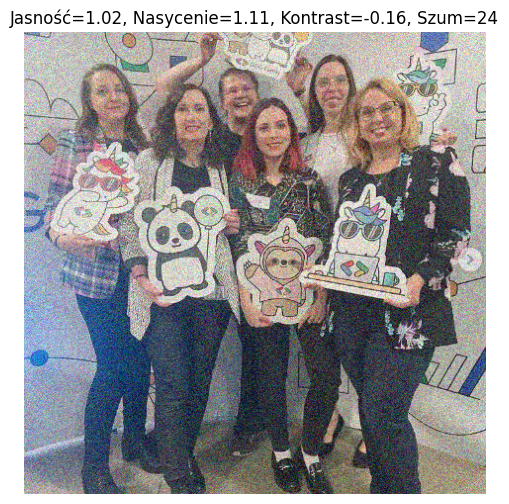

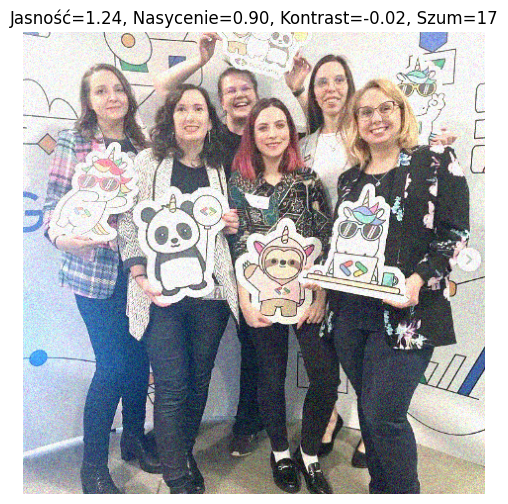

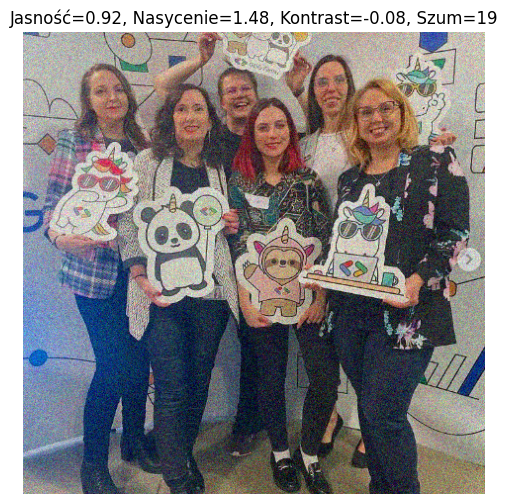

In [12]:

def change_brightness(image, factor):
    return cv2.convertScaleAbs(image, alpha=factor, beta=0)

def change_saturation(image, factor):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[...,1] *= factor
    hsv[...,1] = np.clip(hsv[...,1], 0, 255)
    return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)

def change_contrast(image, factor):
    mean = np.mean(image)
    out = np.clip((1+factor)*(image-mean)+mean, 0, 255).astype(np.uint8)
    return out

def add_noise(image, strength=15):
    noise = np.random.normal(0, strength, image.shape).astype(np.float32)
    out = np.clip(image.astype(np.float32)+noise, 0, 255).astype(np.uint8)
    return out

def random_color_augment(image):
    f_b = random.uniform(0.7, 1.4)
    f_s = random.uniform(0.6, 1.5)
    f_c = random.uniform(-0.3, 0.4)
    n   = random.randint(0, 25)
    out = change_brightness(image, f_b)
    out = change_saturation(out, f_s)
    out = change_contrast(out, f_c)
    out = add_noise(out, n)
    return out, (f_b, f_s, f_c, n)

for i in range(3):
    out, params = random_color_augment(img)
    save_rgb(out, f"color_aug_{i+1}.jpg")
    imshow(out, f"Jasność={params[0]:.2f}, Nasycenie={params[1]:.2f}, Kontrast={params[2]:.2f}, Szum={params[3]}")
